<a href="https://colab.research.google.com/github/yaqianhuang/AI2025/blob/main/tutorial_explanations_LMs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Outline

This hands on session is organized into three mostly independent sections:

- SHAP (Perturbation Based Method)
    - Explaining a sentiment analysis RoBERTa language model
    - "Bring your own binary classification task"
- Integrated Gradients and Layer Conductance (Gradient Based Methods)
  - Explaining a question answering BERT model
- Analyzing the Model's Attention Mechianism
  - Of said question answering BERT model

For each of these, you are provided example code for different explanation- and analysis methods and a list of *suggested questions*.


> **Note:** The methods, models and tasks are chosen to match computation time and resource restrictions.

# Setup

**Expects 15 GB GPU Memory (Resources → Change runtime type →
T4 GPU)**

In [ ]:
!pip install datasets captum bertviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 23.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 1.5 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does

In [ ]:
import os

In [ ]:
import datasets
import numpy as np
import transformers
import shap
import random
from tqdm import tqdm

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import pandas as pd

from transformers import AutoTokenizer, AutoModelForQuestionAnswering, BertConfig

from captum.attr import visualization as viz
from captum.attr import LayerConductance, LayerIntegratedGradients

from datasets import load_dataset
from transformers import pipeline

# Explaining Classification Tasks: SHAP Explanations for RoBERTa

> This section is based on an example in the [SHAP Documentation](https://shap.readthedocs.io/en/latest/example_notebooks/text_examples/sentiment_analysis/Positive%20vs.%20Negative%20Sentiment%20Classification.html#Positive-vs.-Negative-Sentiment-Classification)



SHAP is a perturbation-based feature importance explanation method. It explains a decision by identifying what words in the input where influential for the decision.

We will analyze decisions of a `distillBERT-base` model that was fine-tuned for **binary sentiment classification** with the Stanford Sentiment Treebank (SST-2).



In [ ]:
classifier = transformers.pipeline("sentiment-analysis", "distilbert/distilbert-base-uncased-finetuned-sst-2-english",return_all_scores=True)


Device set to use cuda:0
/usr/local/lib/python3.11/dist-packages/transformers/pipelines/text_classification.py:106: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


We use IMDB movie reviews as test data:

In [ ]:
dataset = datasets.load_dataset("imdb", split="test")
random.seed(0)
documents = random.sample(dataset["text"], 100)


documents = [classifier.tokenizer.convert_tokens_to_string(
        classifier.tokenizer.tokenize(d, max_length=200, truncation=True) # shorten to reduce computation time and resource utilization
     ) for d in documents]


In [ ]:
explainer = shap.Explainer(classifier)

To explain one example:

In [ ]:
shap.plots.text(explainer(["This is not good."]))


We choose 10 random documents and generate explanations. SHAP explanations are local, they explain one document at a time. Insights only apply to that one document (and very similar ones)!

In [ ]:
explanations = explainer( tqdm(documents[10:20], desc="Computing explanations"))

Computing explanations: 100%|██████████| 10/10 [00:38<00:00,  3.81s/it]
PartitionExplainer explainer: 11it [00:38,  4.76s/it]


In [ ]:
shap.plots.text(explanations)

If we ignore the context in wich words occur, we can aggregate multiple such explanations into one plot:

Computing explanations:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Computing explanations: 100%|██████████| 10/10 [00:40<00:00,  4.03s/it]
PartitionExplainer explainer: 11it [00:40,  5.04s/it]


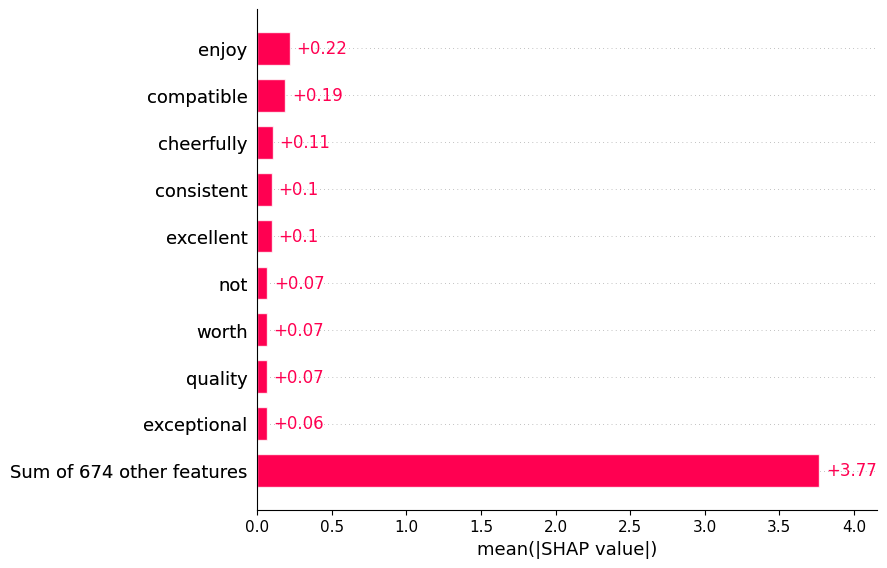

In [ ]:
explanations = explainer( tqdm(documents[0:10], desc="Computing explanations"))
shap.plots.bar(explanations[:, :, "POSITIVE"])

#### Suggested Questions

- What can we learn about model behaviour from the explanations?
  - Does this type of explantion provide enough evidence for this task?
- Write your own documents with (complex, misleading, etc) examples
  - How useful is it for debugging (seemingly) irrational decisions?
- What about other tasks?
  - Browse the hugginface hub for [TextClassification Models](https://huggingface.co/models?pipeline_tag=text-classification&sort=trending) for other tasks you are familiar with and swap the `classifier` and dataset
  - Do your observations abaut the suitability of this explanation method still apply?

In [ ]:
del classifier

# Integrated Gradients

In this section we analyze a BERT model fine-tuned on a **reading comprehension dataset** (SQuAD: Rajpurkar et al. 2016). Let's first discuss the task:


In [ ]:
model_path = "huggingface-course/bert-finetuned-squad" # BERT, fine-tuned on the SQuAD dataset
pipe = pipeline("question-answering", model=model_path)
tokenizer = AutoTokenizer.from_pretrained(model_path)


dataset = load_dataset("rajpurkar/squad")["train"]

# Need to limit example lenght for this tutorial
is_short_enough = lambda example : (len(tokenizer(example["context"], truncation=True, padding=False)["input_ids"]) + len(tokenizer(example["question"], truncation=True, padding=False)["input_ids"]))<= 50
filtered_dataset = dataset.filter(is_short_enough, num_proc=100)

Device set to use cuda:0


This model was trained to find the answer to a `question` in the provided document (`context`):

In [ ]:
example = filtered_dataset[52]


question = example["question"]
ground_truth = example["answers"]["text"][0]
context = example["context"]

print("Input:")
print("\tquestion:", question)
print("\tcontext:", context)
print("\tground_truth: \t", ground_truth)

model_output = pipe(question=question, context=context)
response = model_output["answer"]


print()
print("Model response:")
print("\t>>",response, "<< at indices ", model_output["start"], "-", model_output["end"])

Input:
	question: What type of fixtures are used typically used for indoor lighting?
	context: Indoor lighting is usually accomplished using light fixtures, and is a key part of interior design. Lighting can also be an intrinsic component of landscape projects.
	ground_truth: 	 light fixtures

Model response:
	>> light fixtures << at indices  46 - 60


### Generating Explanations (Integrated Gradients)  
> We apply an attribution method from Sundararajan et al. 2017 that is implemented by the Capturm library: [https://captum.ai/tutorials/Bert_SQUAD_Interpret](https://captum.ai/tutorials/Bert_SQUAD_Interpret)


This method approximates how the output of a model changes when the input changes from this baseline to the actual input of interest.
*Integrated Gradients* compute the path integral of the gradients from a baseline $x'$ (a "neutral" input example, consisting of only `pad` tokens here) to the input of interest $x$.


Specifically, Sundararajan et al. sum the gradients at regular intervals along the straightline path from $x'$ to $x$.


In [ ]:

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# initialize the model
model = AutoModelForQuestionAnswering.from_pretrained(model_path, output_attentions=True)
model.to(device)
model.eval()
model.zero_grad()


In [ ]:
# You may ignore this cell
# It defines a set of utility functions that link the explanation framework (captum) we use here with the quesiton answering model we load from the huggingface hub
# Code slightly adjusted from the Captum documentation for compatability
# see https://captum.ai/tutorials/Bert_SQUAD_Interpret for a detailed walktrough

ref_token_id = tokenizer.pad_token_id # A token used for generating token reference
sep_token_id = tokenizer.sep_token_id # A token used as a separator between question and text and it is also added to the end of the text.
cls_token_id = tokenizer.cls_token_id # A token used for prepending to the concatenated question-text word sequence

def predict(inputs, token_type_ids=None, position_ids=None, attention_mask=None):
    """
    Helper function for Captum
    """
    output = model(inputs, token_type_ids=token_type_ids, position_ids=position_ids, attention_mask=attention_mask, )
    return output.start_logits, output.end_logits, output.attentions

def squad_pos_forward_func(inputs, token_type_ids=None, position_ids=None, attention_mask=None, position=0):
    """
    Wrapper required for Captum
    """
    pred = predict(inputs,
                   token_type_ids=token_type_ids,
                   position_ids=position_ids,
                   attention_mask=attention_mask)
    pred = pred[position] # 0=output.start_logits, 1=output.end_logits, 2=output.attentions
    return pred.max(1).values


def construct_input_ref_pair(question, text, ref_token_id, sep_token_id, cls_token_id):
    """
    Conceptually, this function concatenates the question and context (text in wich the model must locate the answer)
    Format:
    [CLS] Question [SEP] Context

    and then encodes it for use with the model (as input_ids)

    """
    question_ids = tokenizer.encode(question, add_special_tokens=False)
    text_ids = tokenizer.encode(text, add_special_tokens=False)

    # construct input token ids
    input_ids = [cls_token_id] + question_ids + [sep_token_id] + text_ids + [sep_token_id]

    # construct reference token ids
    ref_input_ids = [cls_token_id] + [ref_token_id] * len(question_ids) + [sep_token_id] + \
        [ref_token_id] * len(text_ids) + [sep_token_id]

    return torch.tensor([input_ids], device=device), torch.tensor([ref_input_ids], device=device), len(question_ids)

def construct_input_ref_token_type_pair(input_ids, sep_ind=0):
    """
    Returns a mask that marks wich tokens (obtained with construct_input_ref_pair) are part of the question and wich ones are part of the context
    """
    seq_len = input_ids.size(1)
    token_type_ids = torch.tensor([[0 if i <= sep_ind else 1 for i in range(seq_len)]], device=device)
    ref_token_type_ids = torch.zeros_like(token_type_ids, device=device)# * -1
    return token_type_ids, ref_token_type_ids

def construct_input_ref_pos_id_pair(input_ids):
    """
    Translates token indices to word positon indices
    Needed as a single word can be tokenized into multiple tokens
    """
    seq_length = input_ids.size(1)
    position_ids = torch.arange(seq_length, dtype=torch.long, device=device)
    # we could potentially also use random permutation with `torch.randperm(seq_length, device=device)`
    ref_position_ids = torch.zeros(seq_length, dtype=torch.long, device=device)

    position_ids = position_ids.unsqueeze(0).expand_as(input_ids)
    ref_position_ids = ref_position_ids.unsqueeze(0).expand_as(input_ids)
    return position_ids, ref_position_ids

def construct_attention_mask(input_ids):
    return torch.ones_like(input_ids)



def construct_whole_bert_embeddings(input_ids, ref_input_ids, \
                                    token_type_ids=None, ref_token_type_ids=None, \
                                    position_ids=None, ref_position_ids=None):
    """
    Wrapper required for Captum
    """
    input_embeddings = model.bert.embeddings(input_ids, token_type_ids=token_type_ids, position_ids=position_ids)
    ref_input_embeddings = model.bert.embeddings(ref_input_ids, token_type_ids=ref_token_type_ids, position_ids=ref_position_ids)

    return input_embeddings, ref_input_embeddings

def summarize_attributions(attributions):
    """
    Aggregates (sums) attributions accross layers or heads
    """
    attributions = attributions.sum(dim=-1).squeeze(0)
    attributions = attributions / torch.norm(attributions)
    return attributions

The dataset provides questions and a context in wich the model should locate the answer:

In [ ]:
example

{'id': '56df50f88bc80c19004e4a65',
 'title': 'Lighting',
 'context': 'Indoor lighting is usually accomplished using light fixtures, and is a key part of interior design. Lighting can also be an intrinsic component of landscape projects.',
 'question': 'What type of fixtures are used typically used for indoor lighting?',
 'answers': {'text': ['light fixtures'], 'answer_start': [46]}}

We first need to format this example in a certain way for processing with the model:

`[CLS] <question> [SEP] <context> [SEP]`

In [ ]:
input_ids, ref_input_ids, sep_id = construct_input_ref_pair(question, context, ref_token_id, sep_token_id, cls_token_id)
token_type_ids, ref_token_type_ids = construct_input_ref_token_type_pair(input_ids, sep_id)
position_ids, ref_position_ids = construct_input_ref_pos_id_pair(input_ids)
attention_mask = construct_attention_mask(input_ids)

indices = input_ids[0].detach().tolist()
all_tokens = tokenizer.convert_ids_to_tokens(indices)

print(" ".join(all_tokens))

[CLS] What type of fixtures are used typically used for indoor lighting ? [SEP] Indoor lighting is usually accomplished using light fixtures , and is a key part of interior design . Light ##ing can also be an intrinsic component of landscape projects . [SEP]


The correct answer is also provided by the dataset:

In [ ]:
ground_truth_tokens = tokenizer.encode(ground_truth, add_special_tokens=False)
ground_truth_end_ind = indices.index(ground_truth_tokens[-1])
ground_truth_start_ind = ground_truth_end_ind - len(ground_truth_tokens) + 1

This reading comprehension task boils down to making two decisions: choosing the right start- and end_ids.

The model estimates probabilites that a given token ist the start- or end of the answer:

In [ ]:
start_scores, end_scores,output_attentions = predict(input_ids, \
                                   token_type_ids=token_type_ids, \
                                   position_ids=position_ids, \
                                   attention_mask=attention_mask)

print("logits:")
start_scores

logits:


tensor([[ -9.5224, -10.1822, -11.0427, -10.8216, -10.0708, -10.8600, -10.8939,
         -10.7489, -10.7899, -10.2876, -10.2495, -10.1820, -10.7658, -10.0767,
          -2.9142,  -5.9678,  -8.5305,  -5.1969,  -8.4503,  -4.2699,   8.3808,
          -0.8248,  -6.9250,  -9.2282,  -9.1786,  -8.8721,  -9.1002,  -9.2728,
         -10.1664,  -8.2342,  -8.3708, -10.1270,  -4.2220,  -5.7513,  -9.6413,
         -10.1813, -10.1609,  -9.8039,  -9.7129,  -9.7134, -10.0935,  -7.1330,
          -8.2047,  -9.7132, -10.0767]], device='cuda:0',
       grad_fn=<CloneBackward0>)

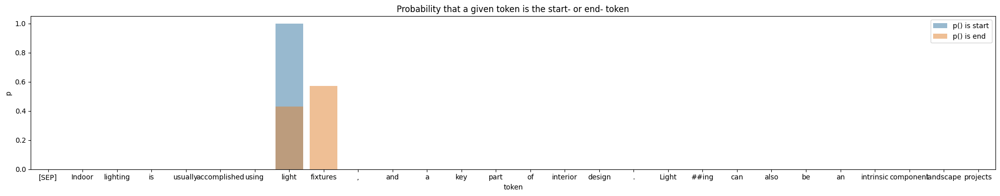

In [ ]:
offset_question = len(input_ids) - len(tokenizer.encode(question, add_special_tokens=False)) - 2

p_start_token = torch.nn.functional.softmax(start_scores, dim=1).cpu().detach().numpy()
p_end_token = torch.nn.functional.softmax(end_scores, dim=1).cpu().detach().numpy()

fig, axes = plt.subplots(1, 1, figsize=(20, 4))
sns.barplot(data=pd.DataFrame({"token": all_tokens, "p": p_start_token.flatten()}).tail(offset_question),
            x="token", y="p", ax=axes, label="p() is start", alpha=0.5)
sns.barplot(data=pd.DataFrame({"token": all_tokens, "p": p_end_token.flatten()}).tail(offset_question),
            x="token", y="p", ax=axes,label="p() is end", alpha=0.5)

plt.title("Probability that a given token is the start- or end- token")
plt.tight_layout()
plt.show()

In an effort to better understand this model's behaviour we know ask:
- What tokens are impactful when determining where the answer starts?
- What tokens are impactful when determining where the answer ends?


To find out, we compute two attribution scores `attributions_start` and `attributions_end` i.r.t `model.bert.embeddings` layer:


In [ ]:
lig = LayerIntegratedGradients(squad_pos_forward_func, model.bert.embeddings)


attributions_start, delta_start = lig.attribute(inputs=input_ids,   # attributions for the start position of the predicted answer
                                                                    # i.e.  explain which tokens influenced the model's decision for the start position
                                                                    #       "what tokens are helpful when determining where the answer starts?"
                                  baselines=ref_input_ids,          # this is the baseline x' in Sundararajan et al. 2017. To obtain our attribution score, this integrates gradients along the path from this baseline (all pad-tokens) to our actual input
                                  additional_forward_args=(token_type_ids, position_ids, attention_mask, 0),
                                  return_convergence_delta=True)

attributions_start_sum = summarize_attributions(attributions_start) #  Riemman approximation of the integral. (see Equation 3 in Sundararajan et al. 2017)

# do the same at the predicted end token
attributions_end, delta_end = lig.attribute(inputs=input_ids, baselines=ref_input_ids,
                                                                                        #       "what tokens are helpful when determining where the answer ends?"
                                additional_forward_args=(token_type_ids, position_ids, attention_mask, 1),
                                return_convergence_delta=True)

attributions_end_sum = summarize_attributions(attributions_end)

We now have **one feature importance score per token** in the input:

In [ ]:
assert input_ids[0].shape == attributions_start_sum.shape == attributions_end_sum.shape

Plots:

In [ ]:
viz.visualize_text([
    viz.VisualizationDataRecord(
                        attributions_start_sum,
                        torch.max(torch.softmax(start_scores[0], dim=0)),
                        torch.argmax(start_scores),
                        torch.argmax(start_scores),
                        str(ground_truth_start_ind),
                        attributions_start_sum.sum(),
                        all_tokens,
                        delta_start)
                ])
print("Tokens that impacted the prediction of the start token")

Tokens that impacted the prediction of the start token


In [ ]:
viz.visualize_text([
   viz.VisualizationDataRecord(
                        attributions_end_sum,
                        torch.max(torch.softmax(end_scores[0], dim=0)),
                        torch.argmax(end_scores),
                        torch.argmax(end_scores),
                        str(ground_truth_end_ind),
                        attributions_end_sum.sum(),
                        all_tokens,
                        delta_end)
                ])
print("Tokens that impacted the prediction of the end token")

Tokens that impacted the prediction of the end token


### Suggested Questions

- Do you think this type of explantion provide enough evidence to understand model decisions?
  - Is it plausible that the model decision is based on the words specified by the explanation?

- Look at additional examples from the dataset (change the index in `example = filtered_dataset[40]`)
  - Find and analyze wrong model decisions
    - Do your observations regarding plasability still apply?
- Write your own question- context pairs (e.g., misleading examples)
  - How useful is it to debug wrong or (seemingly) irrational decisions?
  



# Layer Importance: Layer Attribution

Layer Conductance ([Dhamdhere et al. 2018](https://arxiv.org/abs/1805.12233)) is an extension of integrated gradients that attribuites importance to tokens layer-wise. One can track feature importance trough the network this way:

> "Informally, the conductance of a hidden unit of a deep network is the flow of attribution via this hidden unit." ([Dhamdhere et al. 2018](https://arxiv.org/abs/1805.12233))


We use Captum's `LayerConductance` method to generate an explanation that tells us which tokens where important in individual layers:

In [ ]:
# obtain attribution scores for each hidden layer

for i in range(model.config.num_hidden_layers):
    lc = LayerConductance(squad_pos_forward_func_l, model.bert.encoder.layer[i])
    layer_attributions_start = lc.attribute(inputs=input_embeddings, baselines=ref_input_embeddings, additional_forward_args=(token_type_ids, position_ids,attention_mask, 0), internal_batch_size=16)
    layer_attributions_end = lc.attribute(inputs=input_embeddings, baselines=ref_input_embeddings, additional_forward_args=(token_type_ids, position_ids,attention_mask, 1), internal_batch_size=16)

    # for the start token prediction
    layer_attrs_start.append(summarize_attributions(layer_attributions_start[0]))
    layer_attrs_end.append(summarize_attributions(layer_attributions_end[0]))

    # for the end token prediction
    layer_attn_mat_start.append(layer_attributions_start[1])
    layer_attn_mat_end.append(layer_attributions_end[1])


# aggregate attribution scores
layer_attrs_start = torch.stack(layer_attrs_start)
layer_attrs_end = torch.stack(layer_attrs_end)

# aggregate attention matrices
layer_attn_mat_start = torch.stack(layer_attn_mat_start)
layer_attn_mat_end = torch.stack(layer_attn_mat_end)

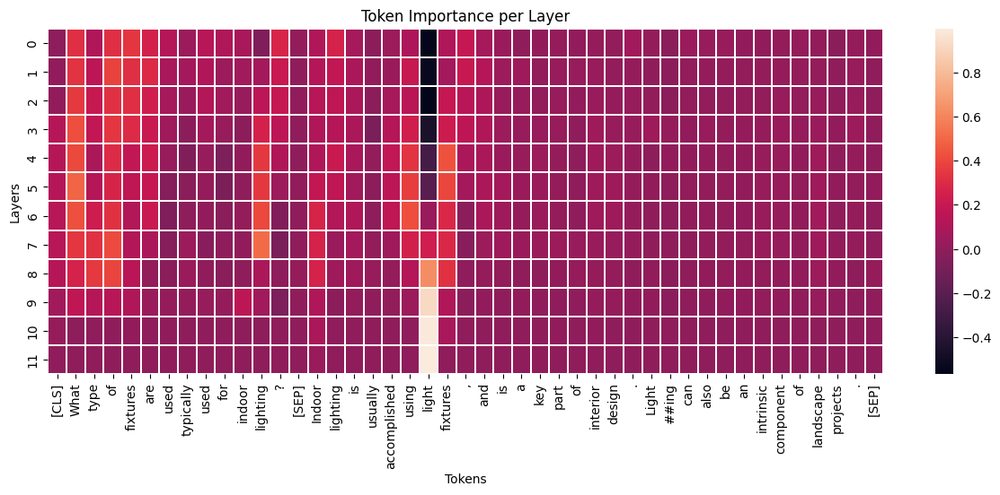

In [ ]:
fig, ax = plt.subplots(figsize=(15,5))
ax = sns.heatmap(layer_attrs_start.cpu().detach().numpy(), xticklabels=all_tokens, yticklabels=list(range(0,layer_attrs_start.shape[0])), linewidth=0.2)
plt.xlabel('Tokens')
plt.ylabel('Layers')
plt.title("Token Importance per Layer")
plt.show()

# Attention

Different from to the two explanation methods we have seen up to this point, this third method soley looks at a **single model component**: the model's attention mechianism.

Plots in this section should not be considered full explanations, as they are not directly tied to model behaviour:

The *attention scores* we will extract inform about what words the model is attending to (considering, paying attention to). Much like an eye-tracking device can't directly track human thoughts, high attention scores do not guarantee that a given token actually impacted the decision.

> We rely on code from the [Captum documentation](https://captum.ai/tutorials/Bert_SQUAD_Interpret) for this section as well  

In [ ]:
example = filtered_dataset[52]


question = example["question"]
ground_truth = example["answers"]["text"][0]
context = example["context"]

## (1/2) Raw attention weights

First, we plot the **attention weights** used during forward pass by the model.

$A = softmax(\frac{QK^T}{\sqrt{d_k}})$:

In [ ]:
# You may skip this cell

import math
import matplotlib.pyplot as plt
import imageio
import numpy as np
from IPython.display import Image

def visualize_token2token_scores(scores_mat, x_label_name='Head', caption=""):
    """
    Utility function to plot per-token heatmaps, first as GIF then individually.
    You may skip this cell
    """


    ##### plot gif
    imgs = []  # List to store images for the GIF

    for idx, scores in enumerate(scores_mat):
        fig, ax = plt.subplots(figsize=(7, 7))  # Create a new figure for each heatmap

        # Plot the attention weights for the current frame
        im = ax.imshow(scores, cmap='viridis')

        fontdict = {'fontsize': 10}

        ax.set_xticks(range(len(all_tokens)))
        ax.set_yticks(range(len(all_tokens)))

        ax.set_xticklabels(all_tokens, fontdict=fontdict, rotation=90)
        ax.set_yticklabels(all_tokens, fontdict=fontdict)
        ax.set_xlabel(f'{x_label_name} {idx + 1}')

        ax.set_title(caption)
        plt.tight_layout()
        # Capture the current plot as an image
        plt.draw()
        image = np.array(fig.canvas.renderer.buffer_rgba())
        imgs.append(image)

        # Close the figure to save memory
        plt.close(fig)

    # Create the GIF from the captured images
    imageio.mimsave("temp.gif", imgs, loop=0, format="GIF", fps=1)  # Duration between frames can be adjusted
    display(Image(data=open("temp.gif",'rb').read(), format='png'))
    os.remove("temp.gif")


    ##### plot subplots
    fig = plt.figure(figsize=(25, 45))
    imgs = []
    for idx, scores in enumerate(scores_mat):
        ax = fig.add_subplot(math.ceil(len(scores_mat)/3),3, idx+1)
        # append the attention weights
        im = ax.imshow(scores, cmap='viridis')
        imgs.append(im)
        fontdict = {'fontsize': 10}

        ax.set_xticks(range(len(all_tokens)))
        ax.set_yticks(range(len(all_tokens)))

        ax.set_xticklabels(all_tokens, fontdict=fontdict, rotation=90)
        ax.set_yticklabels(all_tokens, fontdict=fontdict)
        ax.set_xlabel('{} {}'.format(x_label_name, idx+1))
    plt.tight_layout()
    plt.show()

Obtain prediction for the example from before:

In [ ]:
start_scores, end_scores, output_attentions = predict(input_ids,
                                   token_type_ids=token_type_ids, \
                                   position_ids=position_ids, \
                                   attention_mask=attention_mask)
output_attentions_all = torch.stack(output_attentions)

### Per Head

To plot raw attention scores for all 16 attention heads at **one specific layer**:

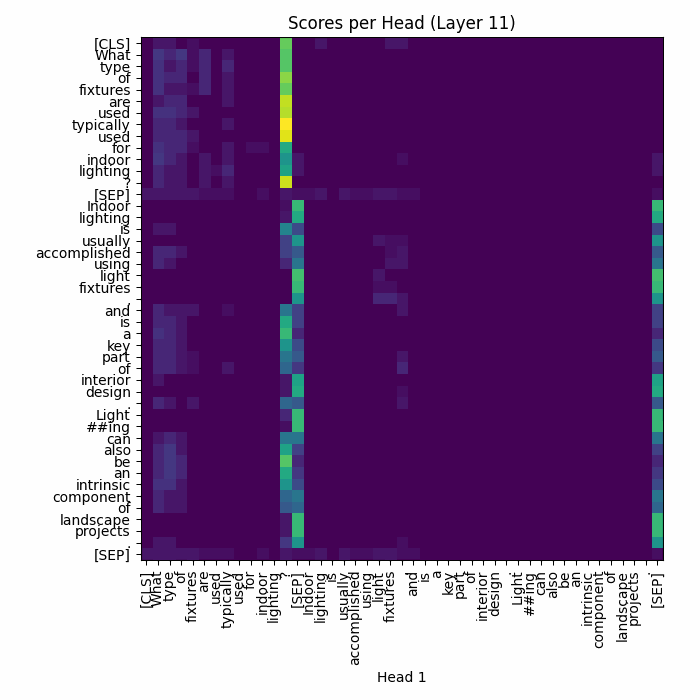

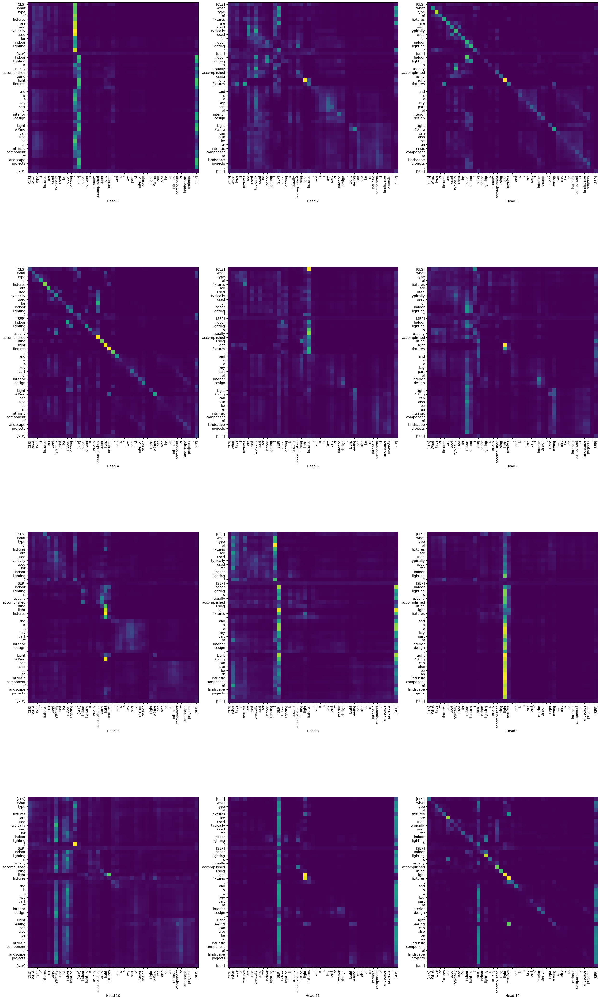

In [ ]:
layer = 11
visualize_token2token_scores(output_attentions_all[layer].squeeze().detach().cpu().numpy(), caption="Scores per Head (Layer 11)")

### Per Layer
To get one heat-map **per layer**:

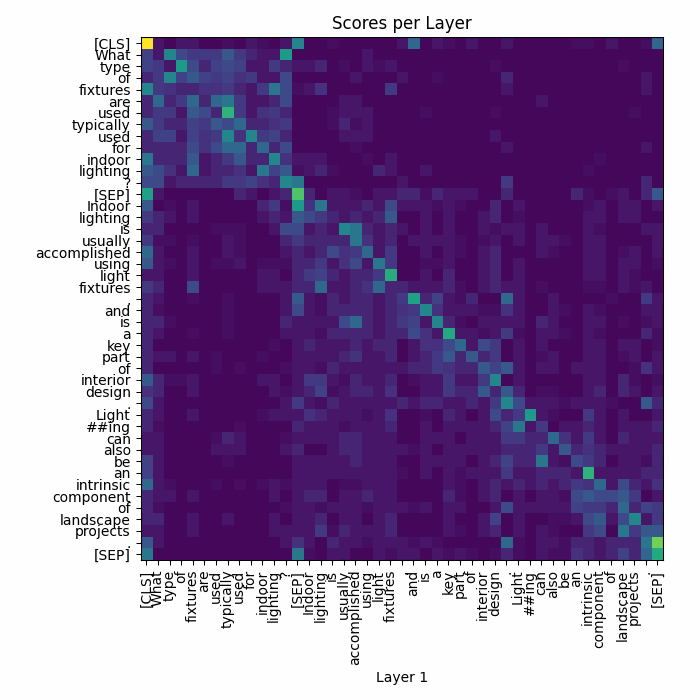

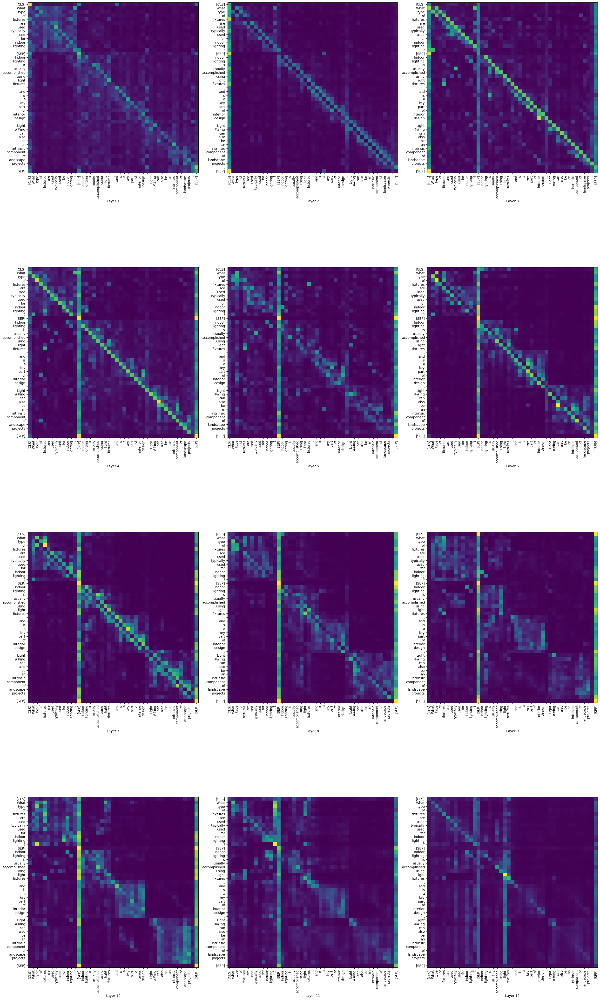

In [ ]:
visualize_token2token_scores(torch.linalg.norm(output_attentions_all, dim=2).squeeze().detach().cpu().numpy(),
                             x_label_name='Layer', caption="Scores per Layer")

Raw attention scores are difficult to interpret: the [SEP] and diagonal patterns make it hard to see which tokens actually matter. They end up washing out all other information in the plots.

In the next section, we'll look at vector norms, still following the examples from the Captum documentation.

### (2/2) Normalized attention (Vector Norms)

[Kobayashi et al. (2020)](https://arxiv.org/pdf/2004.10102.pdf) suggest to normalize by $f(x)$ i.e. account for impact of magnitude of $f(x)$ on embedding update, not just the attention scores $\alpha$.


For purpouses of this tutorial you may skip to the plots.

In [ ]:
# From the captum documentation
# You may skip this cell

output_attentions_all_shape = output_attentions_all.shape

batch = output_attentions_all_shape[1]
num_heads = output_attentions_all_shape[2]
head_size = 64
all_head_size = 768

layers = [model.bert.encoder.layer[layer].attention.self.value for layer in range(len(model.bert.encoder.layer))]


from captum.attr import LayerActivation

from captum.attr import configure_interpretable_embedding_layer
interpretable_embedding = configure_interpretable_embedding_layer(model, 'bert.embeddings.word_embeddings')

def construct_whole_bert_embeddings(input_ids, ref_input_ids, \
                                    token_type_ids=None, ref_token_type_ids=None, \
                                    position_ids=None, ref_position_ids=None):
    input_embeddings = interpretable_embedding.indices_to_embeddings(input_ids)
    ref_input_embeddings = interpretable_embedding.indices_to_embeddings(ref_input_ids)

    return input_embeddings, ref_input_embeddings


layer_attrs_start = []
layer_attrs_end = []

layer_attn_mat_start = []
layer_attn_mat_end = []

input_embeddings, ref_input_embeddings = construct_whole_bert_embeddings(input_ids, ref_input_ids, \
                                         token_type_ids=token_type_ids, ref_token_type_ids=ref_token_type_ids, \
                                         position_ids=position_ids, ref_position_ids=ref_position_ids)



def squad_pos_forward_func_l(inputs, token_type_ids=None, position_ids=None, attention_mask=None, position=0):
    pred = model(inputs_embeds=inputs, token_type_ids=token_type_ids,
                 position_ids=position_ids, attention_mask=attention_mask, )
    pred = pred[position]
    return pred.max(1).values




la = LayerActivation(squad_pos_forward_func_l, layers)

value_layer_acts = la.attribute(input_embeddings, additional_forward_args=(token_type_ids, position_ids, attention_mask))
# shape -> layer x batch x seq_len x all_head_size
value_layer_acts = torch.stack(value_layer_acts)

new_x_shape = value_layer_acts.size()[:-1] + (num_heads, head_size)
value_layer_acts = value_layer_acts.view(*new_x_shape)

# layer x batch x neum_heads x 1 x head_size
value_layer_acts = value_layer_acts.permute(0, 1, 3, 2, 4)

value_layer_acts = value_layer_acts.permute(0, 1, 3, 2, 4).contiguous()
value_layer_acts_shape = value_layer_acts.size()

# layer x batch x seq_length x num_heads x 1 x head_size
value_layer_acts = value_layer_acts.view(value_layer_acts_shape[:-1] + (1, value_layer_acts_shape[-1],))

dense_acts = torch.stack([dlayer.attention.output.dense.weight for dlayer in model.bert.encoder.layer])

dense_acts = dense_acts.view(len(layers), all_head_size, num_heads, head_size)

# layer x num_heads x head_size x all_head_size
dense_acts = dense_acts.permute(0, 2, 3, 1).contiguous()
f_x = torch.stack([value_layer_acts_i.matmul(dense_acts_i) for value_layer_acts_i, dense_acts_i in zip(value_layer_acts, dense_acts)])
f_x.shape

# layer x batch x seq_length x num_heads x 1 x all_head_size)
f_x_shape = f_x.size()
f_x = f_x.view(f_x_shape[:-2] + (f_x_shape[-1],))
f_x = f_x.permute(0, 1, 3, 2, 4).contiguous()

#(layers x batch, num_heads, seq_length, all_head_size)
f_x_shape = f_x.size()

#(layers x batch, num_heads, seq_length)
f_x_norm = torch.linalg.norm(f_x, dim=-1)

f_x_norm.shape

# layer x batch x num_heads x seq_length x seq_length x all_head_size
alpha_f_x = torch.einsum('lbhks,lbhsd->lbhksd', output_attentions_all, f_x)

# layer x batch x num_heads x seq_length x seq_length
alpha_f_x_norm = torch.linalg.norm(alpha_f_x, dim=-1)

/usr/local/lib/python3.11/dist-packages/captum/attr/_models/base.py:191: UserWarning: In order to make embedding layers more interpretable they will be replaced with an interpretable embedding layer which wraps the original embedding layer and takes word embedding vectors as inputs of the forward function. This allows us to generate baselines for word embeddings and compute attributions for each embedding dimension. The original embedding layer must be set back by calling `remove_interpretable_embedding_layer` function after model interpretation is finished. 
  warnings.warn(


### Per Head

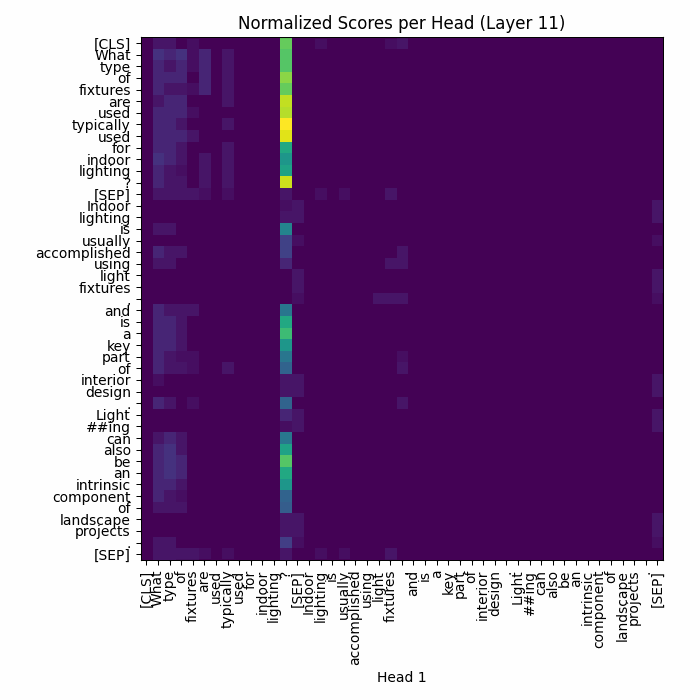

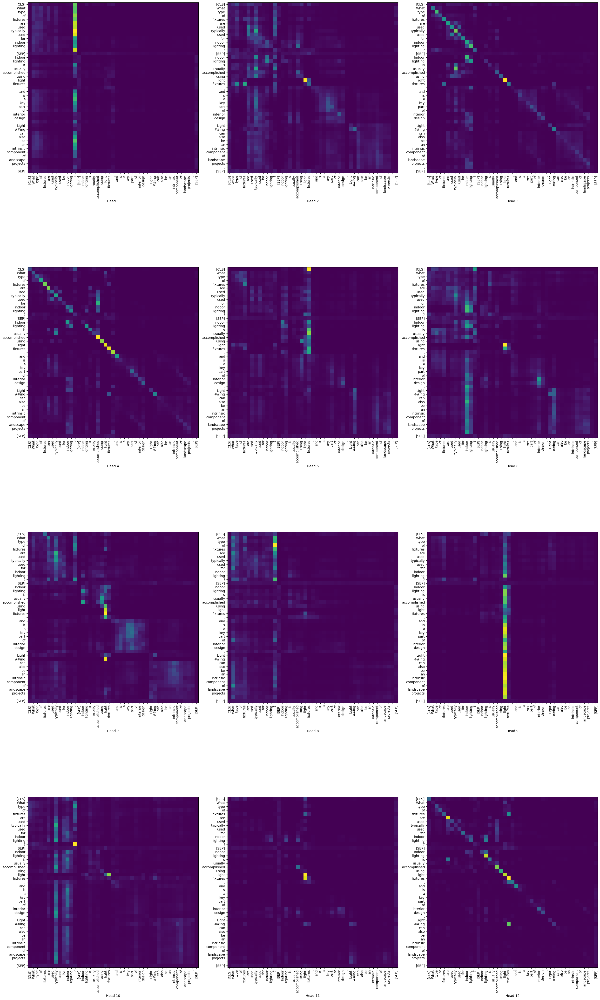

In [ ]:
visualize_token2token_scores(alpha_f_x_norm[layer].squeeze().detach().cpu().numpy(), caption="Normalized Scores per Head (Layer 11)")


## Per Layer

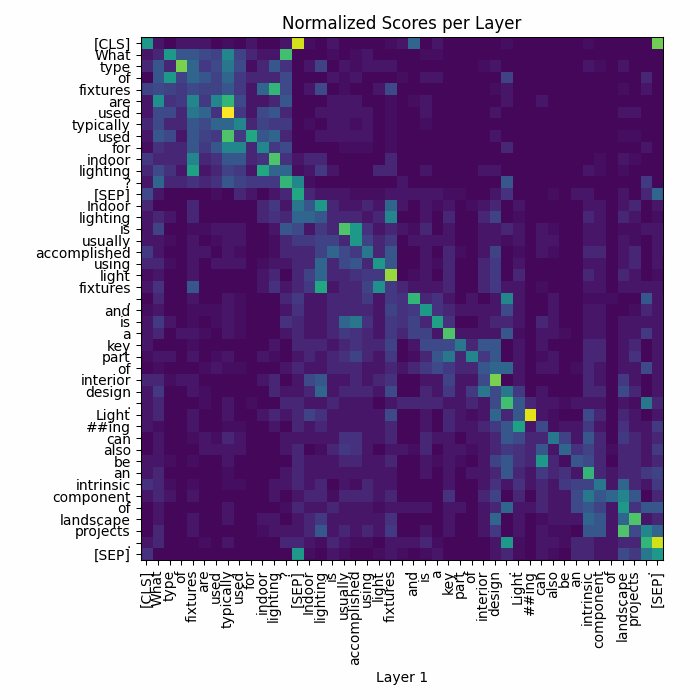

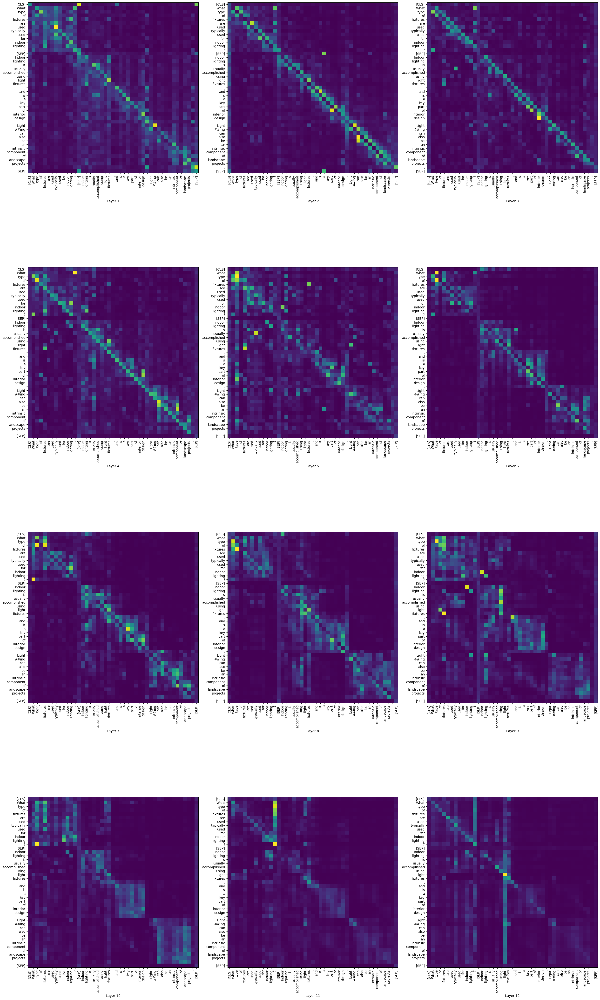

In [ ]:
visualize_token2token_scores(torch.linalg.norm(alpha_f_x.sum(dim=2), dim=-1).squeeze().cpu().detach().numpy(), x_label_name='Layer', caption="Normalized Scores per Layer")


## Suggested Questions

- Change the example and re-run this section.

- Without looking at the model prediction, attempt to guess the model's answer.

  - Is the same head/heatmap always informative?
  - Why could that be?